# A Python Notebook for Clustering Charging Sessions

Once we have a data frame with charging sessions, we can start preparations for clustering them. We are performing some further cleanup, and then we are adding some features to the data frame that we will use for clustering. We are also adding some features that we will use for visualizing the results of the clustering.

This notebook shows how we do this.

Let's load the necessary libraries:

In [1]:
# Parallel processing "throttle" on Windows to overcome sklearn Windows memleak issues
import os
import platform
if platform.system() == 'Windows':
    os.environ['OMP_NUM_THREADS'] = '1'

In [2]:
# Using pathlib for proper path management
from pathlib import Path

# Optimised data storage
import pyarrow.feather as feather

# Data manipulation
import pandas as pd
import geopandas as gpd
import numpy as np

# Data normalisation and scaling
import scipy.stats as stats
from sklearn.preprocessing import StandardScaler

# Data visualization 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Regressions, stats and clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer

# Images in notebooks (for GitHub publishing)
from IPython.display import Image

# Date management
import datetime

## Preparations

1. Loading the data that describes the charging sessions
2. Calculating some features that we will use for clustering

In [3]:
# Let's load the data
internal_users = feather.read_feather(Path.joinpath(Path.cwd(), 'data', 'NETWORK_OPERATOR', 'Charging sessions and service records (BBS) BE only.feather'))

# Calculating the length of the session
internal_users['session_duration'] = (internal_users.end_time - internal_users.start_time).dt.total_seconds()

# Calculating the overall number of sessions on a charging point for the whole period of 12 months
internal_users['session_count'] = internal_users.subscription_id.map(internal_users.subscription_id.value_counts())

In [4]:
# `data_int` is the dataframe we will use for clustering
# the following features are only ones we need
data_int = internal_users[['evse_id', 'connector_type', 'start_time', 'end_time', 'session_duration', 'kWh', 'latitude', 'longitude', 'session_count']].copy()
data_int.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39256 entries, 21328 to 13921
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   evse_id           39256 non-null  object        
 1   connector_type    39256 non-null  object        
 2   start_time        39256 non-null  datetime64[ns]
 3   end_time          39256 non-null  datetime64[ns]
 4   session_duration  39256 non-null  float64       
 5   kWh               39256 non-null  float64       
 6   latitude          39256 non-null  float64       
 7   longitude         39256 non-null  float64       
 8   session_count     39256 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(1), object(2)
memory usage: 3.0+ MB


We are doing the same for external users.

In this case, we will need to add some additional calculated fields that are not available in this dataset. We calculate the power delivered, duration of each session. Additionally, we calculate the number of sessions per charging station.

Some invalid records are also removed.

In [5]:
# Let's do the same with external sessions as well

#Loading data
external_users = feather.read_feather(Path.joinpath(Path.cwd(), 'data', 'NETWORK_OPERATOR', 'Charging sessions (ABS) BE only.feather'))

# Dropping 162 users without a token id
external_users.dropna(subset=['tokeninfo_id'], inplace=True)

# Adding the calculated fields
external_users.rename(columns={'time_started_session': 'start_time', 'time_stopped_session': 'end_time'}, inplace=True)
external_users['session_duration'] = (external_users.end_time - external_users.start_time).dt.total_seconds()
external_users['session_count'] = external_users.tokeninfo_id.map(external_users.tokeninfo_id.value_counts())
external_users['kWh'] = external_users.final_kilo_watt_hour - external_users.start_kilo_watt_hour

# Let's create the dataframe for external users `data_ext`
data_ext = external_users[['evse_id', 'connector_type', 'start_time', 'end_time', 'session_duration', 'kWh', 'latitude', 'longitude', 'session_count']].copy()

### Combining the dataset for external and internal users

In [6]:
data = pd.concat([data_int, data_ext])
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 168583 entries, 21328 to 115085
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   evse_id           168583 non-null  object        
 1   connector_type    168583 non-null  object        
 2   start_time        168583 non-null  datetime64[ns]
 3   end_time          168583 non-null  datetime64[ns]
 4   session_duration  168583 non-null  float64       
 5   kWh               168583 non-null  float64       
 6   latitude          168583 non-null  float64       
 7   longitude         168583 non-null  float64       
 8   session_count     168583 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(1), object(2)
memory usage: 12.9+ MB


In [7]:
# The overall shape of the set
data.shape

(168583, 9)

### Some furtrher data munging and cleaning

In [8]:
# An ugly cleaning

# Dropping sessions with more than 100kWh energy use, as they are clearly invalid. There are no cars with this big batteries. 
data.drop(data[data.kWh > 100.0].index, inplace=True)

# Dropping sessions with less than 2 kWh energy use, as they are failed sessions.
data.drop(data[data.kWh < 2].index, inplace=True)

# We keep this amount of sessions
data.shape

(135228, 9)

In [9]:
# Let's have a "human readable" representation of the session duration

# note: this is not entirely correct or arithmetically safe, gut good enough for a quick check, e.g., dealing with leap seconds, etc.
data['session_duration_str'] = data.session_duration.apply(lambda x: str(datetime.timedelta(seconds=x)))

In [10]:
# We cannot show the evse_id field
data.drop('evse_id', axis=1).sort_values(by=('session_duration'), ascending=False).head(10)

,connector_type,start_time,end_time,session_duration,kWh,latitude,longitude,session_count,session_duration_str
52691,IEC-62196-TYPE2,2022-11-12 17:20:30.000,2023-03-11 14:21:22.000,1.027085e+07,8.356,51.135601,4.474385,77,"118 days, 21:00:52"
13139,TYPE_2,2022-03-30 08:11:38.000,2022-04-29 17:17:39.937,2.624762e+06,14.740,50.881838,4.417300,63,"30 days, 9:06:01.937000"
14696,TYPE_2,2022-04-06 18:07:27.000,2022-05-03 17:22:38.517,2.330112e+06,5.952,50.745399,4.358233,488,"26 days, 23:15:11.517000"
52690,COMBO-TYPE2,2022-12-31 13:50:49.000,2023-01-24 20:10:41.000,2.096392e+06,8.476,50.777336,4.301417,1,"24 days, 6:19:52"
112433,TYPE_2,2022-12-06 17:00:36.000,2022-12-30 17:40:37.000,2.076001e+06,12.083,51.062551,3.624584,237,"24 days, 0:40:01"
52689,IEC-62196-TYPE2,2022-12-31 15:27:57.000,2023-01-24 09:11:16.000,2.050999e+06,18.870,51.323354,4.520753,19,"23 days, 17:43:19"
22406,TYPE_2,2022-05-11 13:37:51.247,2022-06-02 13:57:59.083,1.902008e+06,17.102,50.606562,5.519148,67,"22 days, 0:20:07.836000"
17994,IEC-62196-TYPE2,2022-08-09 14:03:37.000,2022-08-29 14:18:36.000,1.728899e+06,27.701,51.009878,4.515389,78,"20 days, 0:14:59"
61210,TYPE_2,2022-08-30 10:27:09.000,2022-09-18 13:46:53.000,1.653584e+06,38.444,50.899151,4.683595,322,"19 days, 3:19:44"
45109,TYPE_2,2022-07-15 11:22:42.037,2022-08-03 11:51:03.897,1.643302e+06,16.973,50.606562,5.519148,67,"19 days, 0:28:21.860000"


Some quite ugly histograms are produced, but they are useful for understanding the data.

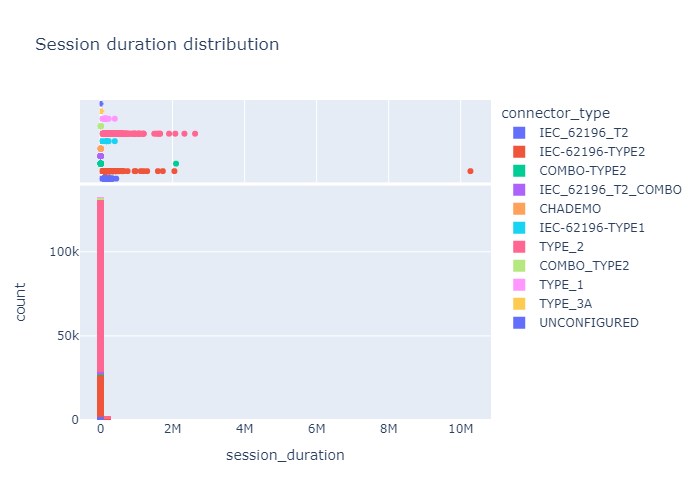

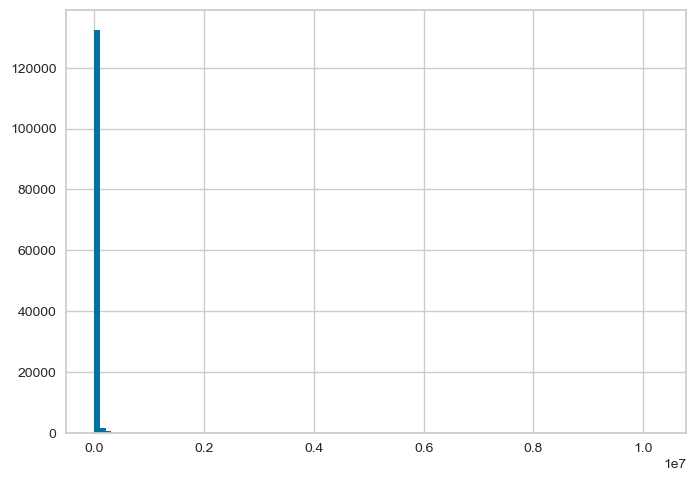

In [11]:
# Using matplotlib
data.session_duration.hist(bins=100)

# Using Plotly
fig = px.histogram(data, x="session_duration", nbins=100, title='Session duration distribution', color='connector_type', marginal="box", hover_data=data.columns)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

In [12]:
# Allocating sessions into bins
bins = range(0, 26, 6)
labels = ['0h-6h', '6h-12h', '12h-18h', '18h-24h']

# Adding bins to the dataset
data['start_time_range'] = pd.cut(data.start_time.dt.hour, bins=bins, labels=labels, right=False)
data['end_time_range'] = pd.cut(data.end_time.dt.hour, bins=bins, labels=labels, right=False)

# Let's see a few examples
data.sample(5, random_state=42)[['start_time', 'end_time', 'session_duration', 'start_time_range', 'end_time_range', 'kWh']]

,start_time,end_time,session_duration,start_time_range,end_time_range,kWh
43489,2022-07-10 17:16:16,2022-07-11 08:13:35,53839.0,12h-18h,6h-12h,9.107
3460,2022-01-29 17:51:53,2022-01-30 10:58:47,61614.0,12h-18h,6h-12h,18.000
6314,2022-02-19 14:21:35,2022-02-19 15:23:23,3708.0,12h-18h,12h-18h,3.600
77851,2022-10-07 09:24:48,2022-10-07 17:46:48,30120.0,6h-12h,12h-18h,6.434
40340,2022-06-30 18:48:42,2022-07-01 07:55:17,47195.0,18h-24h,6h-12h,56.324


### A histogram on session durations on a log scale

Using a log y axis, we can read a bit more from the histogram. Mainly, that there are outliers we need to get rid of.

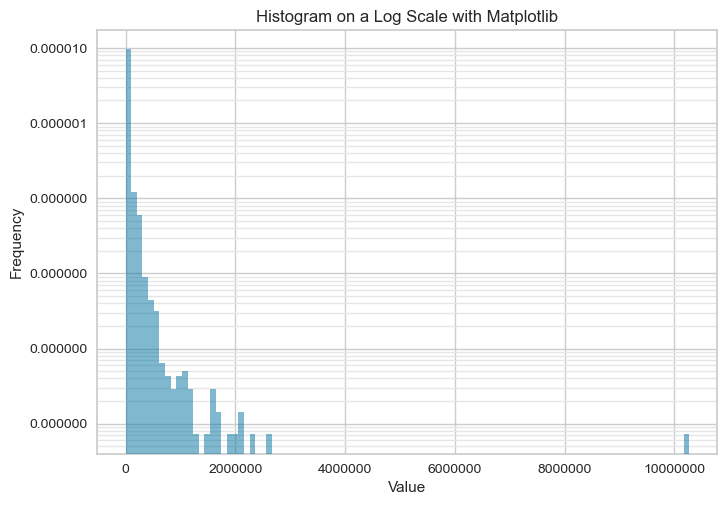

In [13]:
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from matplotlib.ticker import ScalarFormatter

# This is a matplotlib histogram
count, bins, ignored = plt.hist(data.session_duration, 100,  alpha=0.5, zorder=3, density=True)
plt.yscale('log')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram on a Log Scale with Matplotlib')
plt.grid(True, which="major", ls="-", color='0.8')
plt.grid(True, which="minor", ls="-", color='0.9')

# With a simple formatter to have some more human readable numbers
formatter = ScalarFormatter()
formatter.set_scientific(False) 
plt.gca().xaxis.set_major_formatter(formatter)
plt.gca().yaxis.set_major_formatter(formatter)

plt.show()

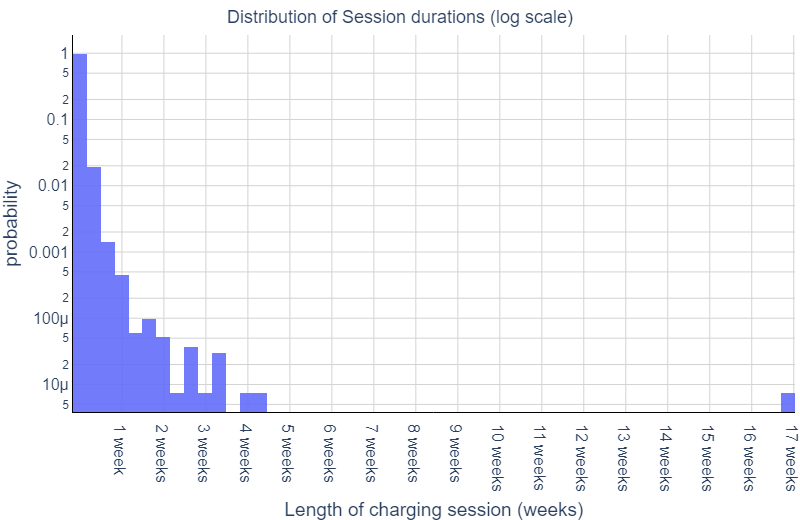

In [14]:
# Now, we can build something a bit more complex with Plotly as well

fig = px.histogram(
    data.sort_values(by=("start_time_range"), ascending=True),
    x="session_duration",
    nbins=100,
    # title='Charging sessions',
    # color="start_time_range",
    # marginal="box",
    # hover_data=data.columns,
    labels={
        "count": "number of sessions",
        "probability": "Probability of sessions",
        "session_duration": "Length of charging session (weeks)",
        "start_time_range": "Session start",
    },
    log_y=True,
    histnorm="probability",
            opacity=0.9,

)
fig.update_layout(
    # paper_bgcolor='rgba(0,0,0,0)', # transparent background
    # plot_bgcolor='rgba(0,0,0,0)' # transparent background
    # paper_bgcolor="white",  # white background
    plot_bgcolor="white",  # white background
    xaxis=dict(
        tickmode="array",
        tickvals=[
            168 * 3600,
            336 * 3600,
            504 * 3600,
            672 * 3600,
            840 * 3600,
            1008 * 3600,
            1176 * 3600,
            1344 * 3600,
            1512 * 3600,
            1680 * 3600,
            1848 * 3600,
            2016 * 3600,
            2184 * 3600,
            2352 * 3600,
            2520 * 3600,
            2688 * 3600,
            2856 * 3600,
            3024 * 3600,
        ],
        ticktext=[
            "1 week",
            "2 weeks",
            "3 weeks",
            "4 weeks",
            "5 weeks",
            "6 weeks",
            "7 weeks",
            "8 weeks",
            "9 weeks",
            "10 weeks",
            "11 weeks",
            "12 weeks",
            "13 weeks",
            "14 weeks",
            "15 weeks",
            "16 weeks",
            "17 weeks",
            "18 weeks"
        ],
    ),
    width=800,
    height=520,
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
    ),
    title_text="Distribution of Session durations (log scale)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),

)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="lightgrey")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="lightgrey")


#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

Now, a box plot to quickly visualize the session duration on a box plot.

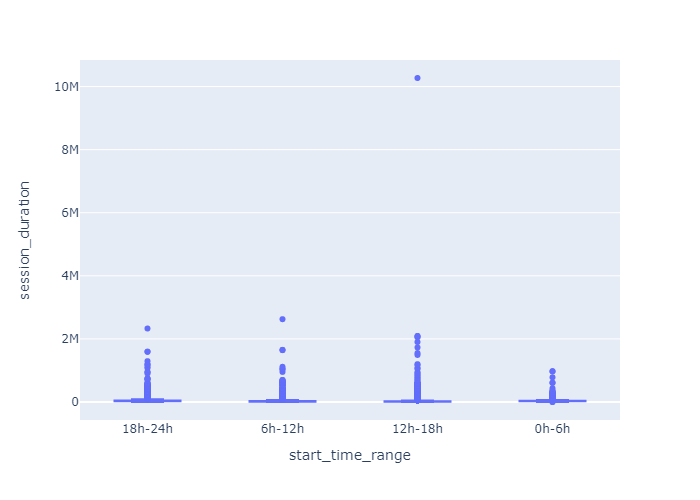

In [15]:
fig = px.box(data, y='session_duration', x='start_time_range')

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

## Data normalization

As we could see on the previous plot, things are not quite right. There seems to be outliers describing erroneous sessions and really "long tails". We need to clean these up.

In [16]:
# Some descriptive statistics

print(f"mean: {data.session_duration.mean()}")
print(f"std:  {data.session_duration.std()}")
print(f"min:  {data.session_duration.min()}")
print(f"max:  {data.session_duration.max()}")
print(f"skew: {data.session_duration.skew()}")

mean: 28613.254849594756
std:  49847.33778958187
min:  0.0
max:  10270852.0
skew: 72.92999880249474


**Let's try some formal but naiive methods to remove outliers.**

First, we will try to calculate the Z score and remove the data points that have a score greater than 3.

Second, we will use the IQR method as well.
Limits applied: Q1 - 1.5\*IQR, Q3 + 1.5\*IQR

mean: 25901.056168639363
std:  23210.56234515204
min:  0.0
max:  177923.0 (human readable: 2 days, 1:25:23)
skew: 1.9925418681268634
Shape of the original dataset: (135228, 12)
Shape of the cleaned dataset : (133996, 12)
Retained: 99.09%


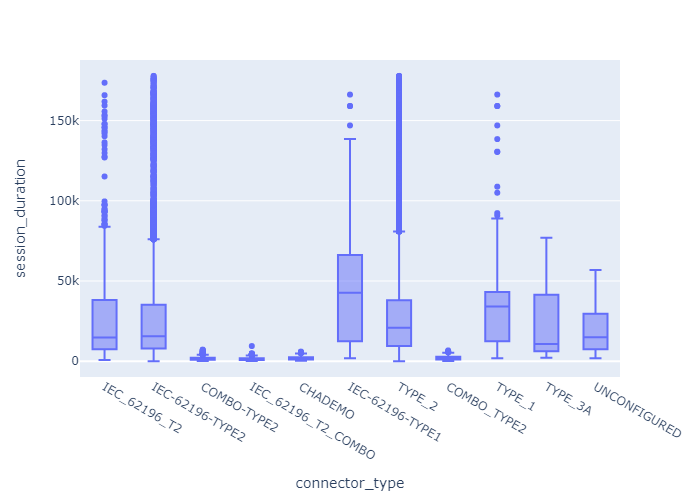

In [17]:
z = np.abs(stats.zscore(data.session_duration))

clean_data = data[(z<3)]
clean_data.sort_values(by=('session_duration'), ascending=False).head(10)

print(f"mean: {clean_data.session_duration.mean()}")
print(f"std:  {clean_data.session_duration.std()}")
print(f"min:  {clean_data.session_duration.min()}")
print(f"max:  {clean_data.session_duration.max()} (human readable: {str(datetime.timedelta(seconds=clean_data.session_duration.max()))})")
print(f"skew: {clean_data.session_duration.skew()}")

print(f"Shape of the original dataset: {data.shape}")
print(f"Shape of the cleaned dataset : {clean_data.shape}")
print(f"Retained: {clean_data.shape[0]/data.shape[0]*100:.2f}%")

fig = px.box(clean_data, y='session_duration', x='connector_type')

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

q1: 8683.0 q2: 37772.25 iqr: 29089.25
mean: 23766.276076513885
std:  18368.70905528717
min:  0.0
max:  81400.0 (human readable: 22:36:40)
skew: 0.8226727052925462
Shape of the original dataset: (135228, 12)
Shape of the cleaned dataset : (130839, 12)
Retained: 96.75%


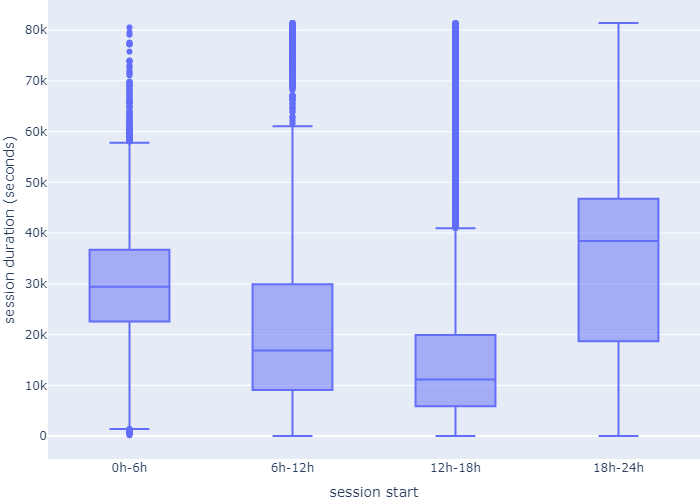

In [18]:
iqr = stats.iqr(data.session_duration)
q1 = data.session_duration.quantile(0.25)
q3 = data.session_duration.quantile(0.75)

print(f"q1: {q1} q2: {q3} iqr: {iqr}")

clean_data = data[
    (data.session_duration > (q1 - 1.5 * iqr))
    & (data.session_duration < (q3 + 1.5 * iqr))
]

print(f"mean: {clean_data.session_duration.mean()}")
print(f"std:  {clean_data.session_duration.std()}")
print(f"min:  {clean_data.session_duration.min()}")
print(
    f"max:  {clean_data.session_duration.max()} (human readable: {str(datetime.timedelta(seconds=clean_data.session_duration.max()))})"
)
print(f"skew: {clean_data.session_duration.skew()}")


print(f"Shape of the original dataset: {data.shape}")
print(f"Shape of the cleaned dataset : {clean_data.shape}")
print(f"Retained: {clean_data.shape[0]/data.shape[0]*100:.2f}%")

fig = px.box(
    clean_data.sort_values(by=("start_time_range"), ascending=True),
    y="session_duration",
    x="start_time_range",
    labels={
        "count": "number of sessions",
        "session_duration": "session duration (seconds)",
        "start_time_range": "session start",
    },
)
fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

This is the last option: we are cleaning up by hand everything that took longer than 24 hours. We are not using output of these, just validating the options above.

mean: 24079.577298954566
std:  18825.028545449797
min:  0.0
max:  86396.43 (human readable: 23:59:56.430000)
skew: 0.8801084854719687
Shape of the original dataset: (135228, 12)
Shape of the cleaned dataset : (131525, 12)
Retained: 97.26%


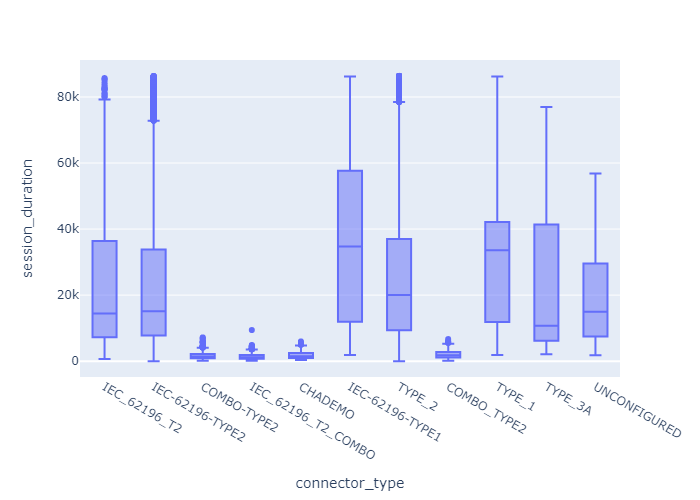

In [19]:
# Removing everything that took more than 24 hours
clean_data = data[ data.session_duration < (60 * 60 * 24)  ]

print(f"mean: {clean_data.session_duration.mean()}")
print(f"std:  {clean_data.session_duration.std()}")
print(f"min:  {clean_data.session_duration.min()}")
print(f"max:  {clean_data.session_duration.max()} (human readable: {str(datetime.timedelta(seconds=clean_data.session_duration.max()))})")
print(f"skew: {clean_data.session_duration.skew()}")

print(f"Shape of the original dataset: {data.shape}")
print(f"Shape of the cleaned dataset : {clean_data.shape}")
print(f"Retained: {clean_data.shape[0]/data.shape[0]*100:.2f}%")

fig = px.box(clean_data, y='session_duration', x='connector_type')

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

As it seems that we are good. Clean up the set.

Let's stick with the IQR method then...

In [20]:
# IQR figure and the quartiles
iqr = stats.iqr(data.session_duration)
q1 = data.session_duration.quantile(0.25)
q3 = data.session_duration.quantile(0.75)

# And now, removing outliers as described by the IQR method
data = data[ (data.session_duration > (q1 - 1.5*iqr)) &
                   (data.session_duration < (q3 + 1.5*iqr))  ].copy()

Adding start and end time representations in seconds. Meaning, that the "number of seconds since midnight". 

In [21]:
data['start_time_seconds'] = data.start_time.dt.time.apply(lambda x: x.hour * 3600 + x.minute * 60 + x.second)
data['end_time_seconds'] = data.end_time.dt.time.apply(lambda x: x.hour * 3600 + x.minute * 60 + x.second)

## Visualizing the data

This section is used to generate some maps and other visualizations we can use for describing the methods we are using.

In [22]:
# We cannot show the evse_id field
data.drop('evse_id', axis=1).sample(10, random_state=42)

,connector_type,start_time,end_time,session_duration,kWh,latitude,longitude,session_count,session_duration_str,start_time_range,end_time_range,start_time_seconds,end_time_seconds
108494,TYPE_2,2022-11-30 22:08:38,2022-12-01 07:03:13,32075.0,16.831,51.064093,3.277519,182,8:54:35,18h-24h,6h-12h,79718,25393
16934,IEC-62196-TYPE2,2022-08-19 08:42:08,2022-08-19 13:04:57,15769.0,11.530,50.920645,3.858246,99,4:22:49,6h-12h,12h-18h,31328,47097
56187,TYPE_2,2022-08-18 05:40:50,2022-08-18 16:33:15,39145.0,6.261,51.207998,3.513497,299,10:52:25,0h-6h,12h-18h,20450,59595
2668,TYPE_2,2022-01-24 07:48:35,2022-01-24 17:04:03,33328.0,8.790,50.931676,4.631160,314,9:15:28,6h-12h,12h-18h,28115,61443
16147,TYPE_2,2022-04-14 09:39:34,2022-04-14 17:20:13,27639.0,32.050,50.799768,4.294377,113,7:40:39,6h-12h,12h-18h,34774,62413
46438,IEC-62196-TYPE2,2022-12-20 07:57:25,2022-12-20 15:07:48,25823.0,54.830,51.071000,5.221749,46,7:10:23,6h-12h,12h-18h,28645,54468
121888,TYPE_2,2022-12-19 08:45:04,2022-12-19 15:17:52,23568.0,29.540,51.217936,4.129590,45,6:32:48,6h-12h,12h-18h,31504,55072
17431,TYPE_2,2022-04-20 19:37:03,2022-04-21 13:18:35,63692.0,12.282,50.932881,4.589783,285,17:41:32,18h-24h,12h-18h,70623,47915
9120,TYPE_2,2022-03-09 09:21:30,2022-03-09 12:13:55,10345.0,29.330,50.799768,4.294377,113,2:52:25,6h-12h,12h-18h,33690,44035
95304,TYPE_2,2022-11-10 07:29:10,2022-11-10 12:39:52,18642.0,7.340,51.204711,4.660766,67,5:10:42,6h-12h,12h-18h,26950,45592


A scatterplot of the charging sessions: on the x axis we can see the start time of the session (hours of the day) and on y axis the duration of the session. The size of the dots represent the "importance" of the charging station: the number of sessions on that station.

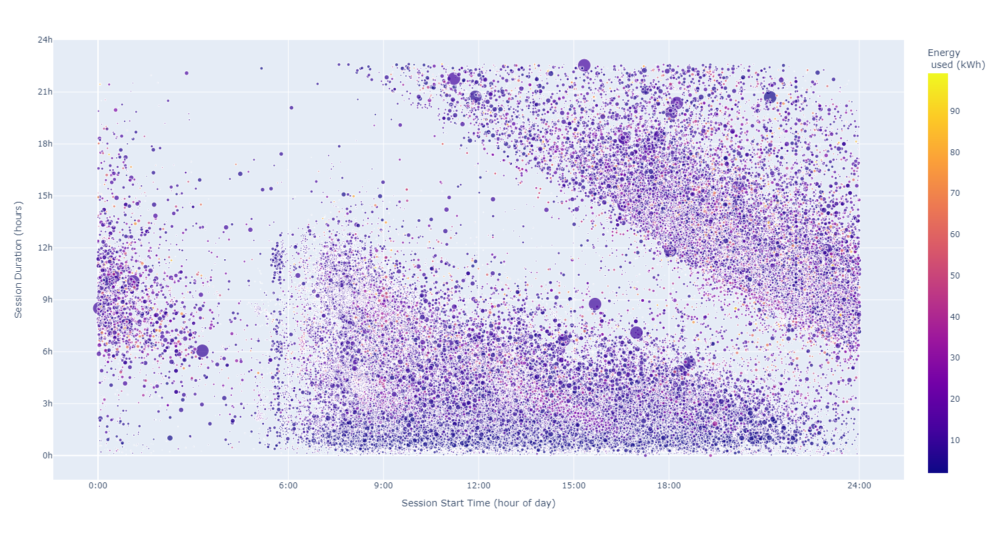

In [23]:
fig = px.scatter(
    data,
    x="start_time_seconds",
    y="session_duration",
    color="kWh",
    size="session_count",
    hover_data=["evse_id"],
    labels={
        "session_duration": "Session Duration (hours)",
        "start_time_seconds": "Session Start Time (hour of day)",
        "session_count": "Number of sessions per user",
        "evse_id": "Charging Station Id",
        "kWh": "Energy<br> used (kWh)"
    },
    width=1500, height=800
)
fig.update_layout(
    #yaxis_tickformat = ",.0f",
    xaxis = dict(
        tickmode = 'array',
        tickvals = [0, 6*3600, 9*3600, 12*3600, 15*3600, 18*3600, 24*3600],
        ticktext = ['0:00', '6:00', '9:00', '12:00', '15:00', '18:00', '24:00']
    ),
    yaxis = dict(
        tickmode = 'array',
        tickvals = [0, 3*3600, 6*3600, 9*3600, 12*3600, 15*3600, 18*3600, 21*3600, 24*3600],
        ticktext = ['0h','3h', '6h', '9h', '12h', '15h', '18h', '21h', '24h']
    )
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

Similarly, for the power delivered.

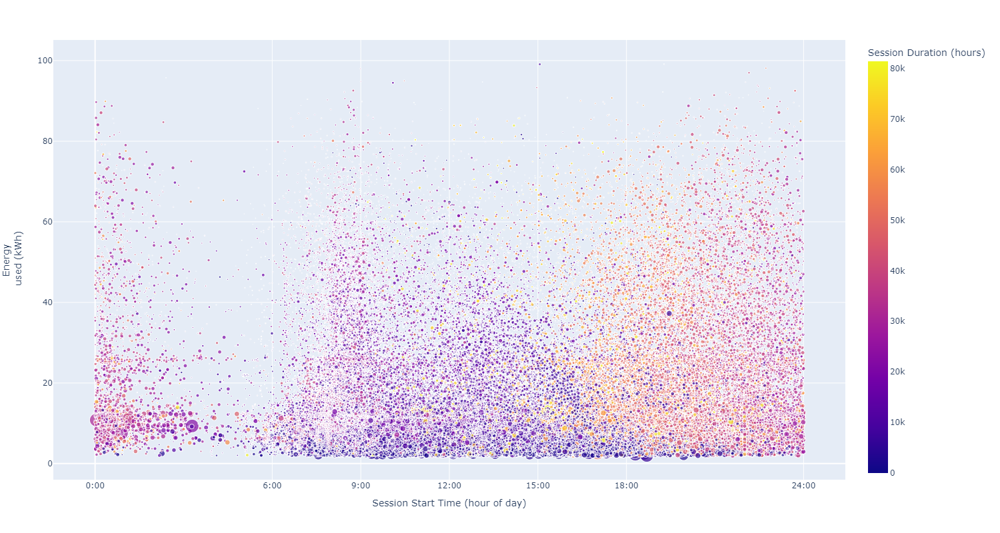

In [24]:
fig = px.scatter(
    data,
    x="start_time_seconds",
    y="kWh",
    color="session_duration",
    size="session_count",
    hover_data=["evse_id"],
    labels={
        "session_duration": "Session Duration (hours)",
        "start_time_seconds": "Session Start Time (hour of day)",
        "session_count": "Number of sessions per user",
        "evse_id": "Charging Station Id",
        "kWh": "Energy<br> used (kWh)"
    },
    width=1500, height=800
)
fig.update_layout(
    #yaxis_tickformat = ",.0f",
    xaxis = dict(
        tickmode = 'array',
        tickvals = [0, 6*3600, 9*3600, 12*3600, 15*3600, 18*3600, 24*3600],
        ticktext = ['0:00', '6:00', '9:00', '12:00', '15:00', '18:00', '24:00']
    ),
    # yaxis = dict(
    #     tickmode = 'array',
    #     tickvals = [0, 3*3600, 6*3600, 9*3600, 12*3600, 15*3600, 18*3600, 21*3600, 24*3600],
    #     ticktext = ['0h','3h', '6h', '9h', '12h', '15h', '18h', '21h', '24h']
    # )
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

Now, an interesting "histogram". Plotting the distribution of session duration and start time on the same plot. The x axis is both the "time of the day" as well as the "length of the session". It needs a bit of time to check the real patterns.

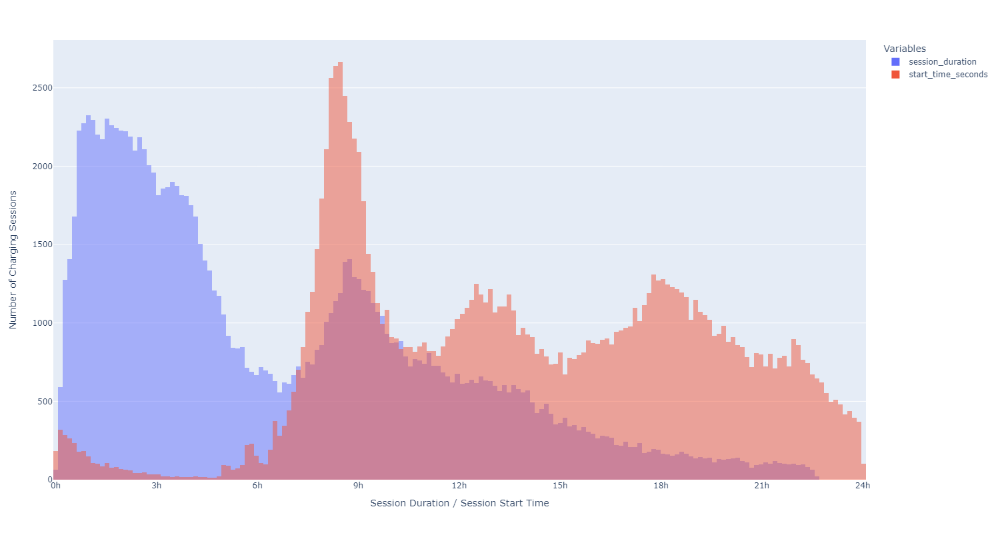

In [25]:
fig = px.histogram(
    data,
    x=["session_duration", "start_time_seconds"],
    # y=["kWh"],
    nbins=250,
    width=1500,
    height=800,
    barmode="overlay",
    labels={
        "session_duration": "Session Duration (hours)",
        "start_time_seconds": "Session Start Time (hour of day)",
        "session_count": "Number of sessions per user",
        "evse_id": "Charging Station Id",
        "kWh": "Energy<br> used (kWh)",
        "variable": "Variables"
    },
)
fig.update_layout(
    xaxis_title_text="Session Duration / Session Start Time",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    yaxis_title_text="Number of Charging Sessions",
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

Now, a histogram on a proper log scale.

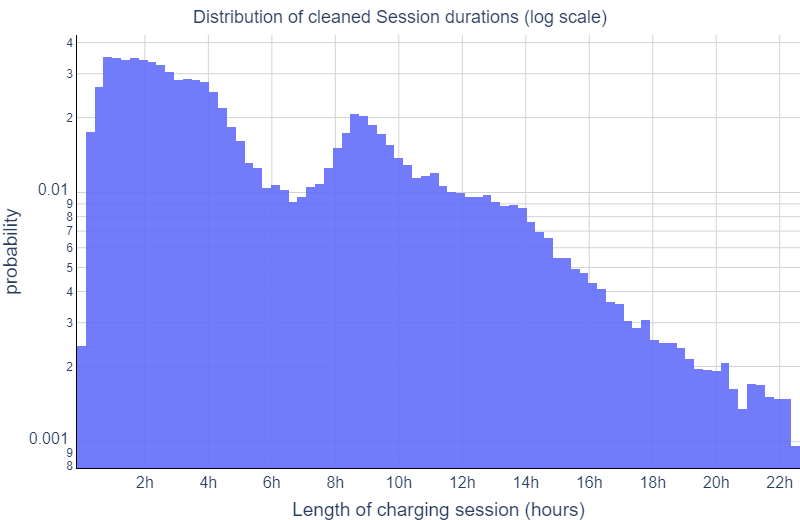

In [26]:
fig = px.histogram(
    data.sort_values(by=("start_time_range"), ascending=True),
    x="session_duration",
    nbins=100,
    labels={
        "count": "number of sessions",
        "probability": "Probability of sessions",
        "session_duration": "Length of charging session (hours)",
        "start_time_range": "Session start",
    },
    log_y=True,
    histnorm="probability",
        opacity=0.9,

)
fig.update_layout(
    # paper_bgcolor='rgba(0,0,0,0)', # transparent background
    # plot_bgcolor='rgba(0,0,0,0)' # transparent background
    # paper_bgcolor="white",  # white background
    plot_bgcolor="white",  # white background
    xaxis=dict(
        tickmode="array",
        tickvals=[
            2 * 3600,
            4 * 3600,
            6 * 3600,
            8 * 3600,
            10 * 3600,
            12 * 3600,
            14 * 3600,
            16 * 3600,
            18 * 3600,
            20 * 3600,
            22 * 3600,
            24 * 3600,

        ],
        ticktext=[
            "2h", "4h", "6h", "8h", "10h", "12h", "14h", "16h", "18h", "20h", "22h", "24h"
        ],
    ),
    width=800,
    height=520,
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text="Distribution of cleaned Session durations (log scale)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),

)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="lightgrey")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="lightgrey")


#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

## Clustering

This part is dedicated for performing the clustering. We are using the KMeans (k-means++ init) algorithm from scikit-learn.

But before getting there, we need to deal with "circular" data and transform the timestamps. Once this is done, we could easily use Euclidean distance measures and still get meaningful results.

X is the dataset we are fitting the model on.

In [27]:
# X is the dataset we will fit our model on

X = pd.DataFrame()
X = data[['evse_id'] + ['session_duration', 'start_time_seconds', 'kWh', 'session_count'] ].copy()

### Representing timestamps as cartesian coordinates

`start_time_x` and `start_time_y` will be used by the clustering algorithm for distance measures.

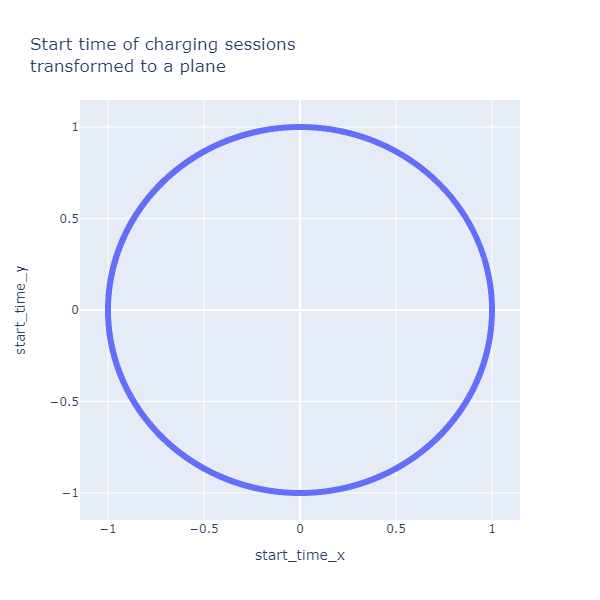

In [28]:
# Getting "hour fractions"
X['start_time_hours'] = X[['start_time_seconds']] / 3600
# "coding" the angle of the start time
X['start_time_x'] = np.sin(2 * np.pi * X['start_time_hours'] / 24)
X['start_time_y'] = np.cos(2 * np.pi * X['start_time_hours'] / 24)

fig = px.scatter(X, x='start_time_x', y='start_time_y',
                 title='Start time of charging sessions<br>transformed to a plane',
                 width=600, height=600) 

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

### Final set of features to be used for clustering

In [29]:
FEATURES = ['start_time_x', 'start_time_y', 'session_duration', 'session_count', 'kWh']

### Scaling

Scaling simply for "standards" as it is okay for our type of data. Features selected for normalisations are scaled using the StandardScaler from scikit-learn.

We are scaling the `FEATURES` list of features.

In [30]:
X.reset_index(drop=True, inplace=True)
#X

In [31]:
# Scaling / normalizing

# We must to scale (e.g. duration is huuuge compared to start time)
X_scaled = pd.DataFrame(StandardScaler().fit_transform(X[FEATURES]),columns = X[FEATURES].columns)

# re-adding the evse_id column
X_scaled = X_scaled.join(X[['evse_id']])


### Checking a DBSCAN fit

We checked how clusters would look if we fit a DBSCAN model with epsilon set to 10.0.

In [32]:
# DBSCAN test

# db = DBSCAN(eps=10, min_samples=3).fit(X_scaled[FEATURES])
# labels = db.labels_

# # Number of clusters in labels, ignoring noise if present.
# n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
# n_noise_ = list(labels).count(-1)

# print("Estimated number of clusters: %d" % n_clusters_)
# print("Estimated number of noise points: %d" % n_noise_)


## k-means clustering

This is the main part of this notebook. We are fitting a k-means model with k=5 on the set `X_scaled`.

But first, let's perform some tests, then look for ways of finding the best hyperparameters.

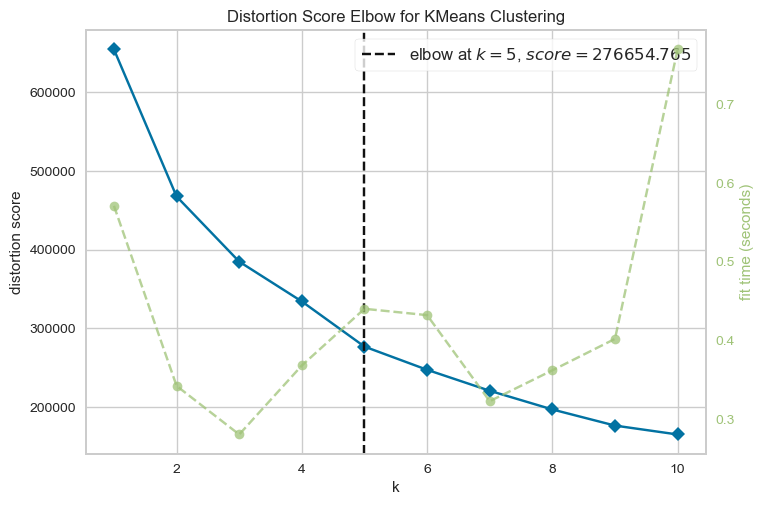

In [33]:
# Our model is k-means with k-means++ initialization
model = KMeans(init='k-means++', n_init='auto', random_state=42)
# Let's see the results of the elbow check
visualizer = KElbowVisualizer(model, k=(1, 11))

visualizer.fit(X_scaled[FEATURES])
visualizer.show()
plt.show()

Checking the Silhouette score for different values of k: from k=2 to k=11, we are checking the silhouette score.

Note: this bit runs for quite a long time. On a standard laptop, it can take more than 30 minutes.

In [34]:
# note: runs for 35 minutes
silhouette_coefficients = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init='auto', random_state=42)
    kmeans.fit(X_scaled[FEATURES])
    score = silhouette_score(X_scaled[['start_time_x', 'start_time_y', 'session_duration', 'session_count', 'kWh']], kmeans.labels_)
    silhouette_coefficients.append(score)

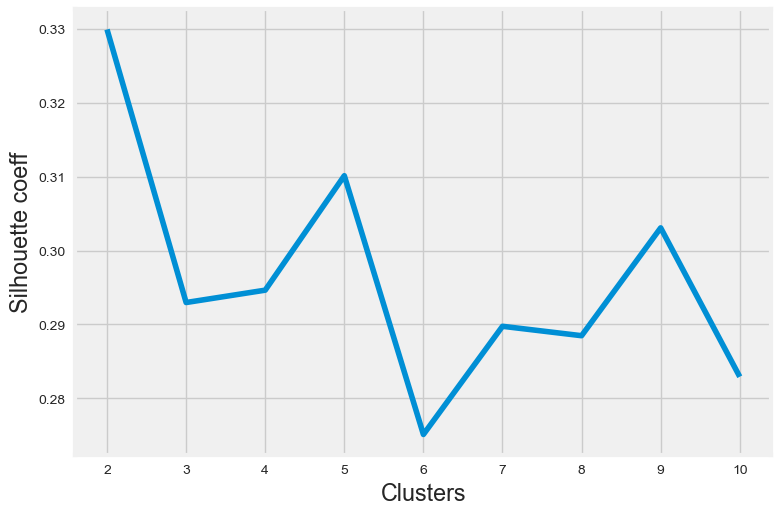

In [36]:
# A really ugly plot of the silhouette coefficients
plt.style.use("fivethirtyeight")
plt.figure(facecolor='white')
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Clusters")
plt.ylabel("Silhouette coeff")
plt.show()

### Fitting the k-means model with k-means++ initialization

In [37]:
# Selecting the number of clusters as per our checks before
N_CLUSTERS = 5

In [38]:
# Setting up model parameters as per our previous findings
kmeans = KMeans(
    n_clusters=N_CLUSTERS,
    init="k-means++",
    n_init="auto",
    max_iter=500, # so we will definitely converge
    random_state=42,
)

# Fitting the model to the scaled data
kmeans.fit(X_scaled[FEATURES])

# adding lables to the scaled data set
X_scaled["kmeans_cluster"] = kmeans.labels_.astype(str)
# adding the same labels to the non-scaled data set (that is used for visualisations and will be persisted)
X["kmeans_cluster"] = kmeans.labels_.astype(str)

# Some info on the fitted model
print(f"k-means inertia: {kmeans.inertia_}")
print(f"Iterations to converge: {kmeans.n_iter_}")

k-means inertia: 276656.33896153397
Iterations to converge: 23


Checking the final set of clusters

(evse_id is just a dummy variable we are counting)

In [39]:
X[['evse_id', 'kmeans_cluster']].groupby('kmeans_cluster').count()

,evse_id
kmeans_cluster,
0,48355
1,14191
2,38600
3,177
4,29516


### Visualizing cluster allocations on multiple plots

We are generating a set of plots that are also used in the write-up.

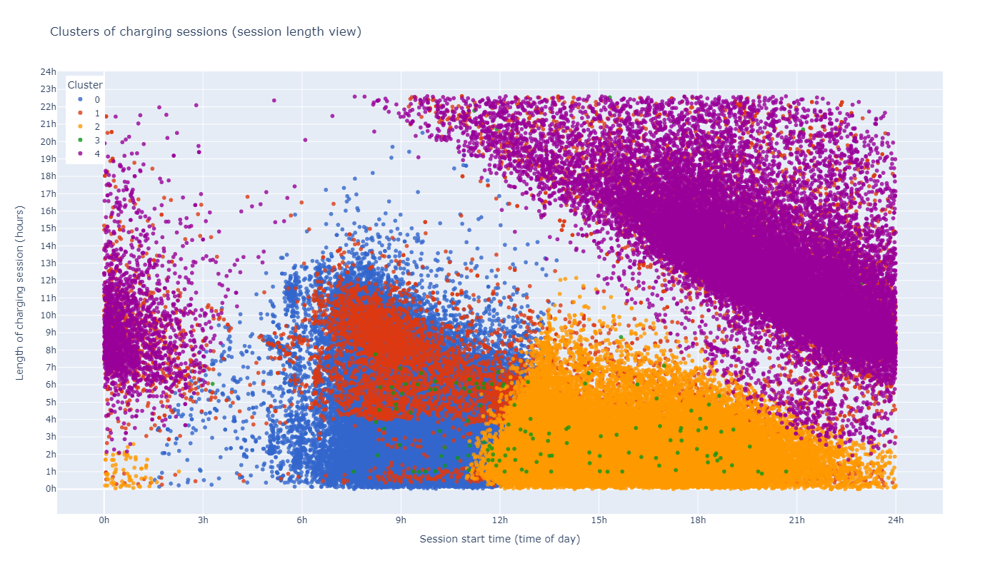

In [40]:
fig = px.scatter(
    X,
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (session length view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


### Scatterplots for individual clusters (Session start time / Duration)

Honestly, this is quite far from an optimal way of generating graphs.

For future use, we should use a loop to generate these plots on all affected axes. But for now, this is what we have.

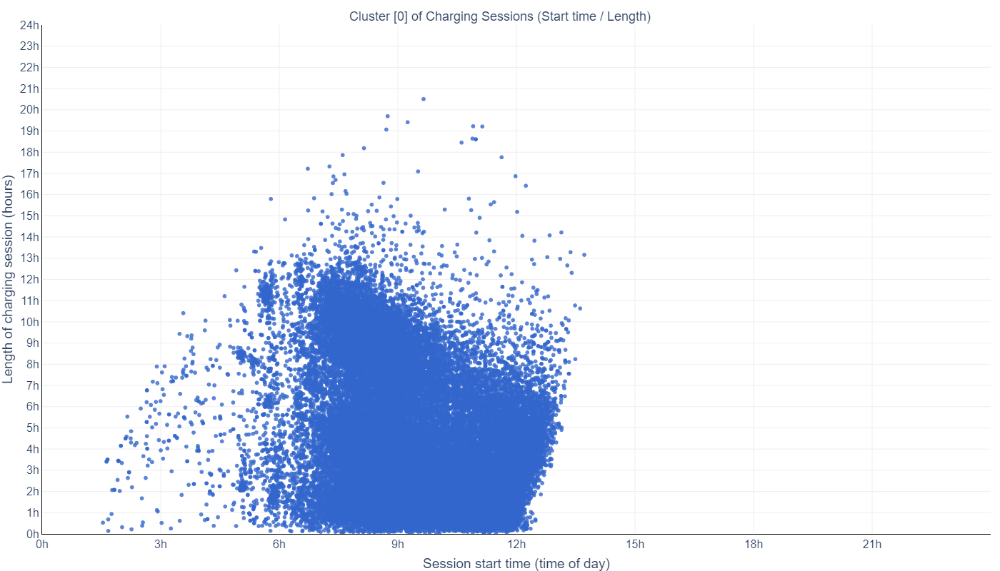

In [41]:
cluster = 0

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (duration view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Length)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,24 * 3600],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


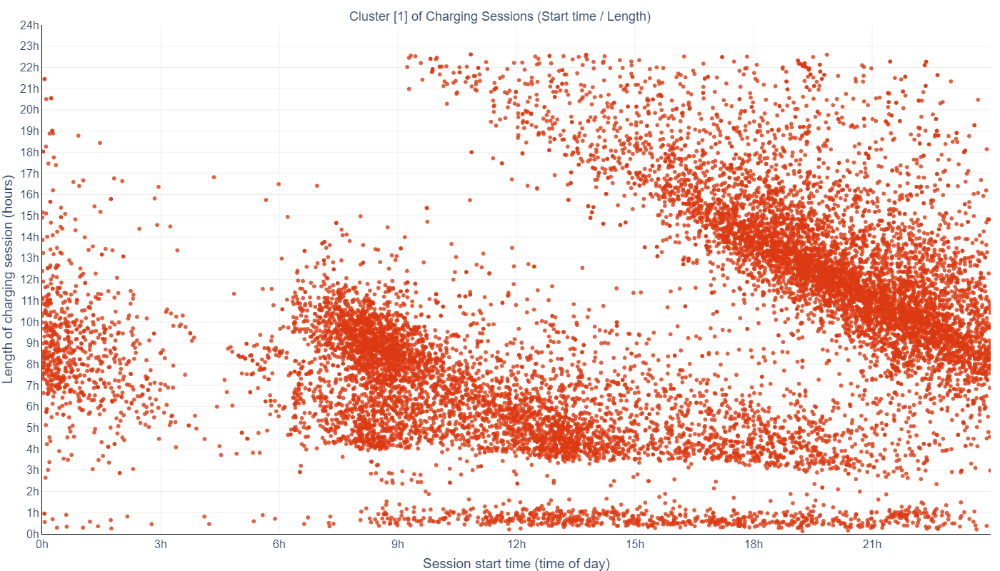

In [42]:
cluster = 1

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (duration view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Length)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,24 * 3600],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


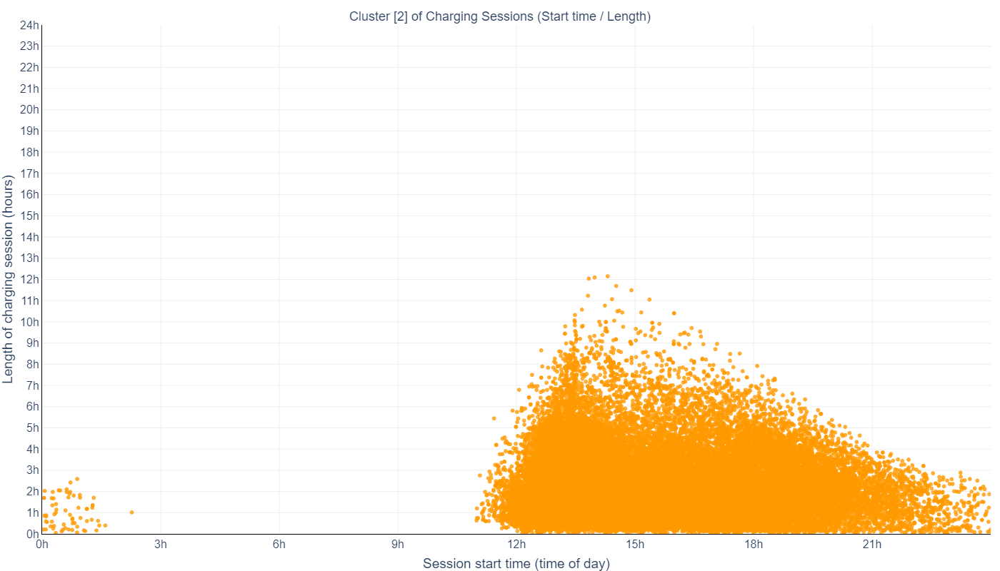

In [43]:
cluster = 2

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (duration view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Length)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,24 * 3600],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


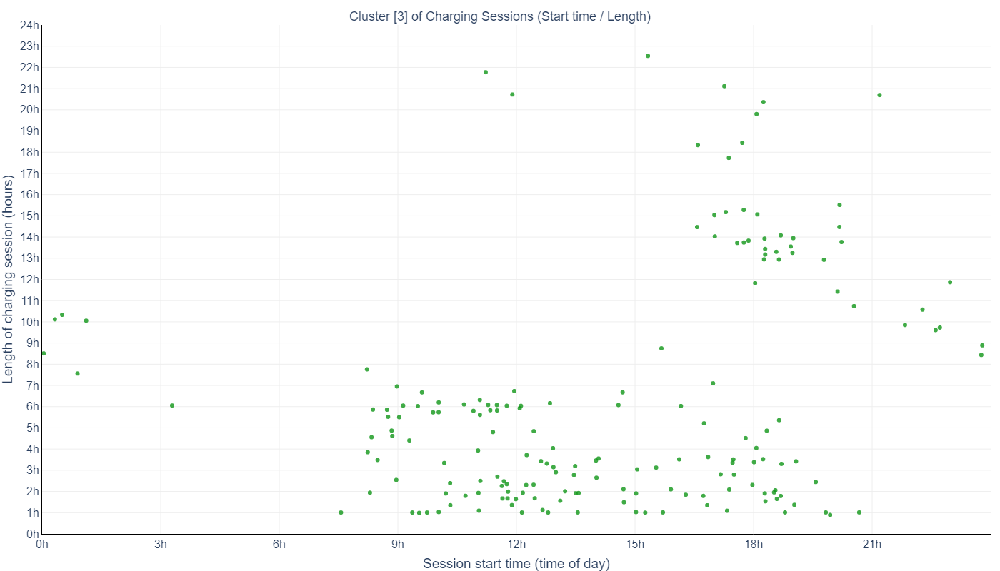

In [44]:
cluster = 3

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (duration view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Length)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,24 * 3600],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


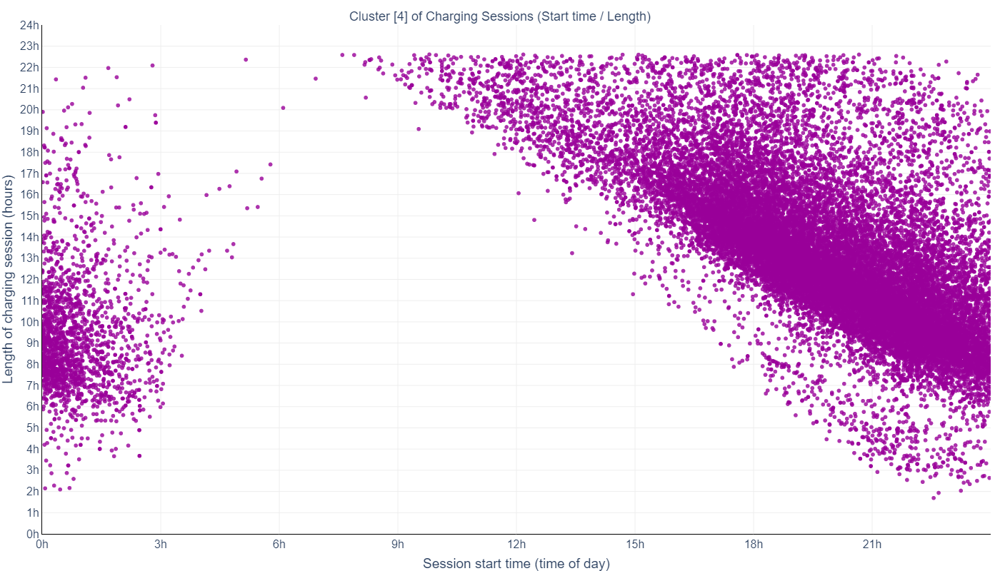

In [45]:
cluster = 4

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (duration view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Length)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,24 * 3600],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


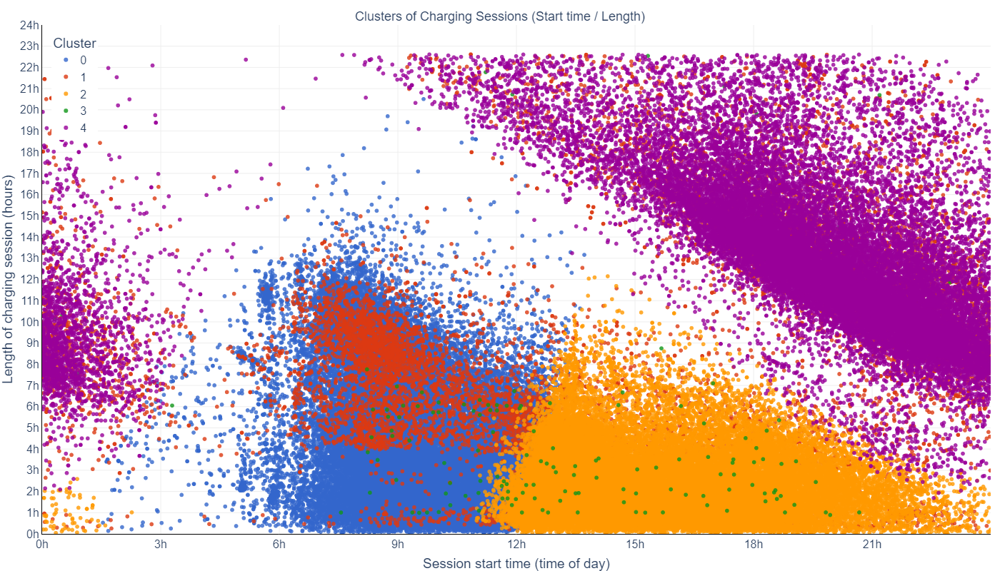

In [46]:
fig = px.scatter(
    X,
    x="start_time_seconds",
    y="session_duration",
    log_y=False,
    title="Clusters of charging sessions (duration view)",
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
     yaxis=dict(
        tickmode="array",
        tickvals=[
            0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
        ],
        ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    ),   
    yaxis_title_text="Length of charging session (hours)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Clusters of Charging Sessions (Start time / Length)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,24 * 3600],
    #showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


### Similar plots for energy use (kWh)

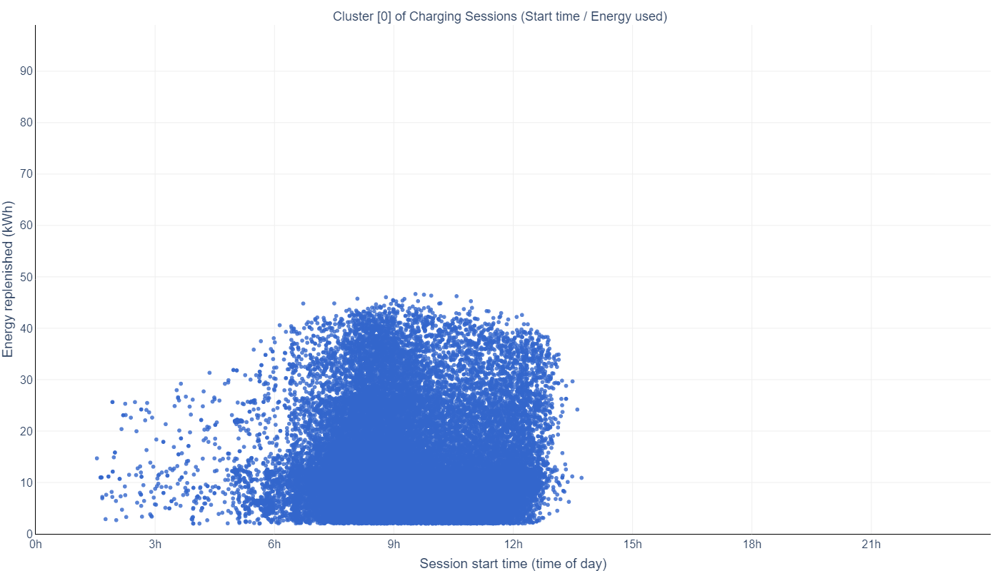

In [47]:
cluster = 0

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="kWh",
    log_y=False,
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    #  yaxis=dict(
    #     tickmode="array",
    #     tickvals=[
    #         0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
    #     ],
    #     ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    # ),   
    yaxis_title_text="Energy replenished (kWh)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Energy used)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,99],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


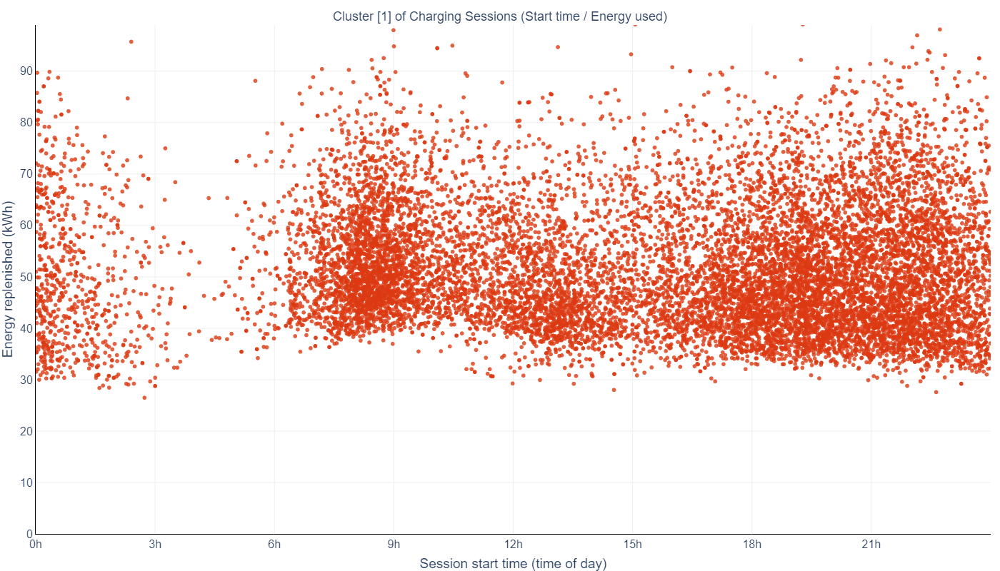

In [48]:
cluster = 1

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="kWh",
    log_y=False,
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    #  yaxis=dict(
    #     tickmode="array",
    #     tickvals=[
    #         0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
    #     ],
    #     ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    # ),   
    yaxis_title_text="Energy replenished (kWh)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Energy used)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,99],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


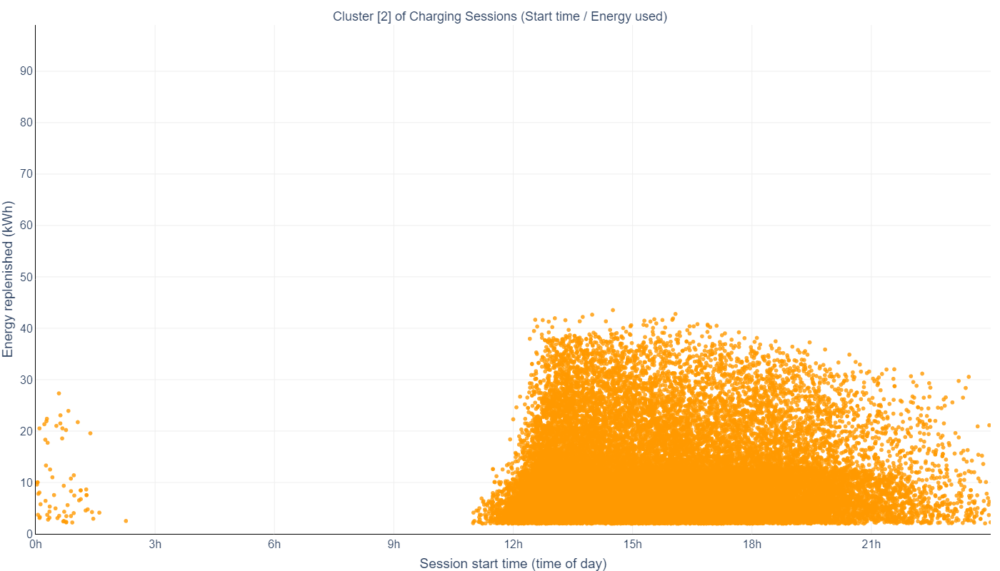

In [49]:
cluster = 2

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="kWh",
    log_y=False,
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    #  yaxis=dict(
    #     tickmode="array",
    #     tickvals=[
    #         0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
    #     ],
    #     ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    # ),   
    yaxis_title_text="Energy replenished (kWh)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Energy used)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,99],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


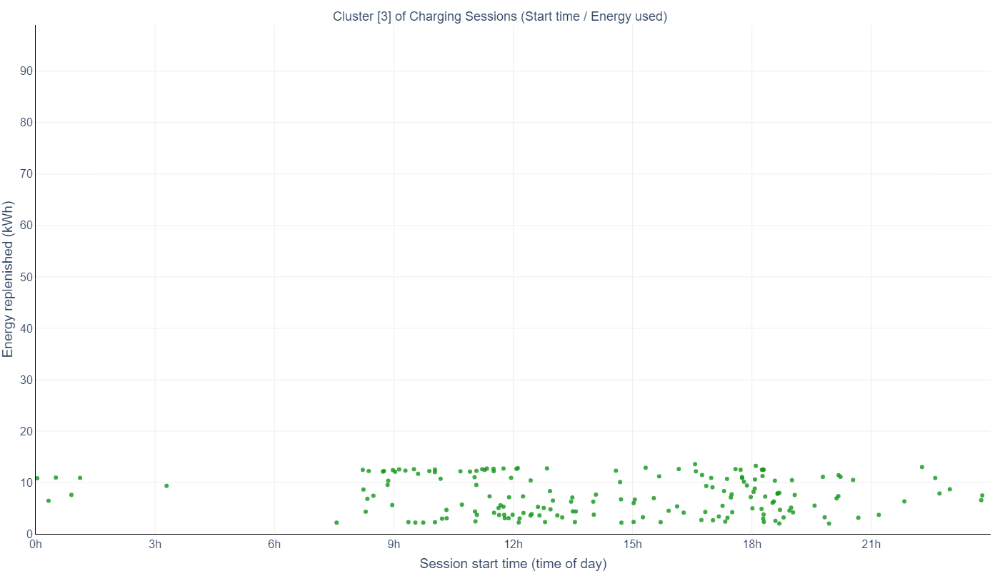

In [50]:
cluster = 3

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="kWh",
    log_y=False,
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    #  yaxis=dict(
    #     tickmode="array",
    #     tickvals=[
    #         0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
    #     ],
    #     ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    # ),   
    yaxis_title_text="Energy replenished (kWh)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Energy used)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,99],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


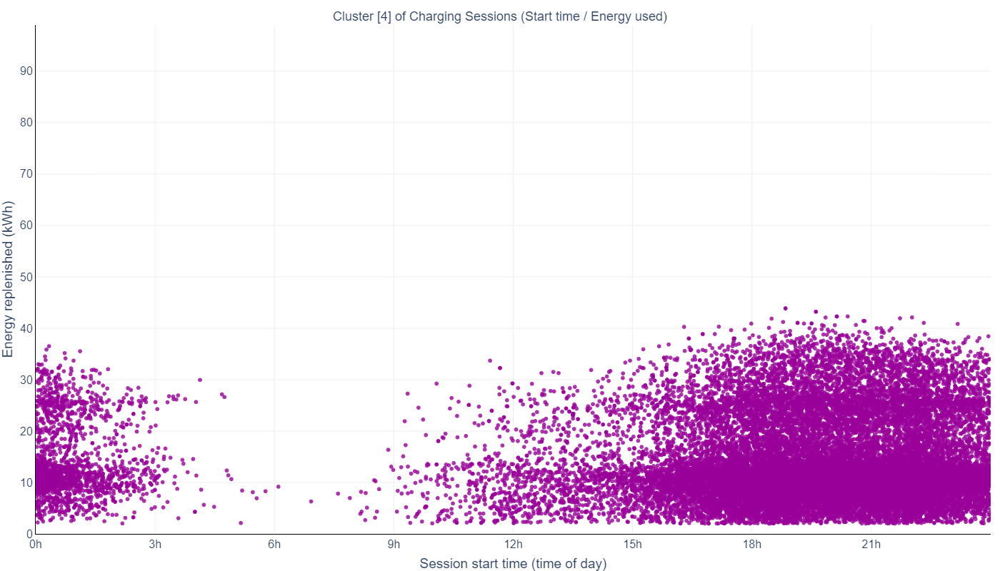

In [51]:
cluster = 4

fig = px.scatter(
    X[X.kmeans_cluster == str(cluster)],
    x="start_time_seconds",
    y="kWh",
    log_y=False,
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    #  yaxis=dict(
    #     tickmode="array",
    #     tickvals=[
    #         0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
    #     ],
    #     ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    # ),   
    yaxis_title_text="Energy replenished (kWh)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Cluster [{cluster}] of Charging Sessions (Start time / Energy used)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,99],
    showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


### Now, for all clusters on one plot

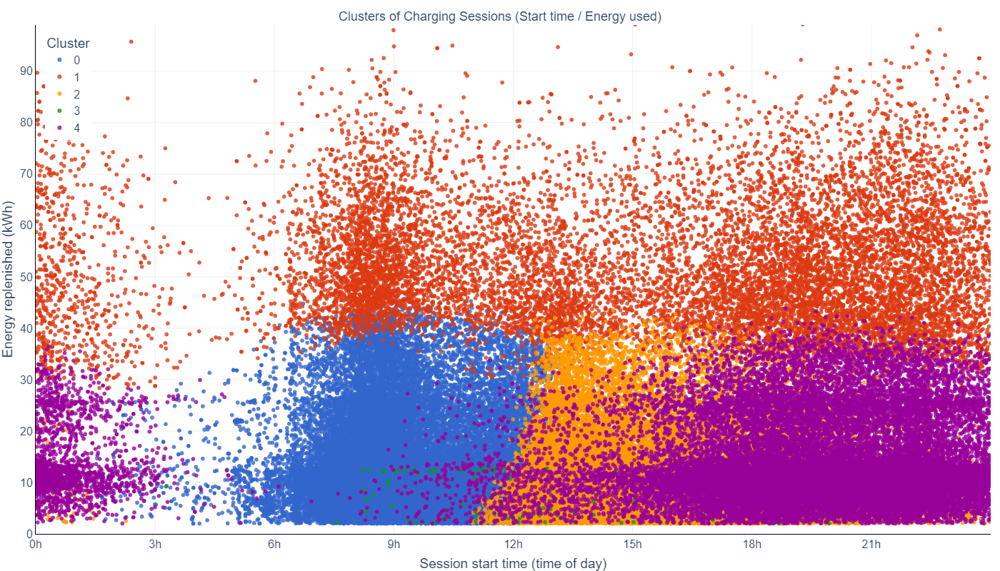

In [52]:
fig = px.scatter(
    X,
    x="start_time_seconds",
    y="kWh",
    log_y=False,
    color="kmeans_cluster",
    labels={"kmeans_cluster": "Cluster"},
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
)
fig.update_layout(
    plot_bgcolor="white",  # white background
    xaxis_title_text="Session start time (time of day)",
    xaxis=dict(
        tickmode="array",
        tickvals=[
            0,
            3 * 3600,
            6 * 3600,
            9 * 3600,
            12 * 3600,
            15 * 3600,
            18 * 3600,
            21 * 3600,
            24 * 3600,
        ],
        ticktext=["0h", "3h", "6h", "9h", "12h", "15h", "18h", "21h", "24h"],
    ),
    #  yaxis=dict(
    #     tickmode="array",
    #     tickvals=[
    #         0, 1 * 3600, 2 * 3600, 3 * 3600, 4 * 3600, 5 * 3600, 6 * 3600, 7 * 3600, 8 * 3600, 9 * 3600, 10 * 3600, 11 * 3600, 12 * 3600, 13 * 3600, 14 * 3600, 15 * 3600, 16 * 3600, 17 * 3600, 18 * 3600, 19 * 3600, 20 * 3600, 21 * 3600, 22 * 3600, 23 * 3600, 24 * 3600
    #     ],
    #     ticktext=["0h", "1h", "2h", "3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h", "24h"],
    # ),   
    yaxis_title_text="Energy replenished (kWh)",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    font=dict(
        family="Arial",
        size=16,  # Set the font size here
        #color="RebeccaPurple",
    ),
    title_text=f"Clusters of Charging Sessions (Start time / Energy used)", title_x=0.5, title_y=0.98, title_font_size=18, title_font_family="Arial",
    margin=dict(l=0, r=0, t=35, b=0),
    xaxis_range=[0,24 * 3600],
    yaxis_range=[0,99],
    #showlegend=False
)
fig.update_xaxes(showline=True, linecolor="black", gridcolor="#eeeeee")
fig.update_yaxes(showline=True, linecolor="black", gridcolor="#eeeeee")

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)


### Map of the clustered charging sessions

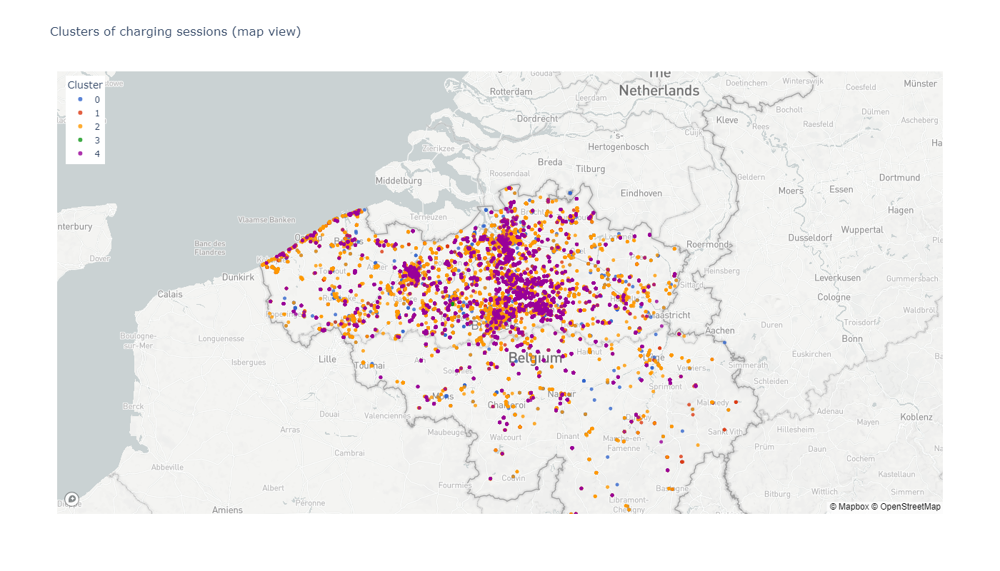

In [53]:
px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_mapbox(
    X,
    lat=data.latitude,
    lon=data.longitude,
    zoom=7,
    color="kmeans_cluster",
    width=1400,
    height=800,
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.G10,
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
    labels={"kmeans_cluster": "Cluster"},
    title="Clusters of charging sessions (map view)",
)
# fig.update_traces(cluster=dict(enabled=True, maxzoom=6))
# fig.update_layout(mapbox_style="open-street-map")
# fig.update_layout(
#    clickmode='event+select',
#    margin={"r":0,"t":0,"l":0,"b":0}
#    )
fig.update_layout(
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

### Cluster centroid visualization

First, we build a dataframe storing centroids that could be visualized on a polar plot afterwards.

In [54]:
# we store centroid data in the dataframe
data_cluster_centroid = pd.DataFrame(
    kmeans.cluster_centers_,
    columns=X_scaled[FEATURES].columns,
)

df = pd.DataFrame()
cluster_no = 0

# a looped way of "transforming / transposing" information
for r in data_cluster_centroid.values.tolist():
    new_cluster = pd.DataFrame(
        dict(
            theta=data_cluster_centroid.columns.tolist(), r=r, kmeans_cluster=cluster_no
        )
    )
    df = pd.concat([df, new_cluster])
    cluster_no += 1

# let's fix teh variable names
df.replace(
    {
        "start_time_x": "Start time (x)",
        "start_time_y": "Start time (y)",
        "session_duration": "Session duration",
        "session_count": "Session count",
        "kWh": "Energy (kWh)",
    },
    inplace=True,
)

Visualizing it

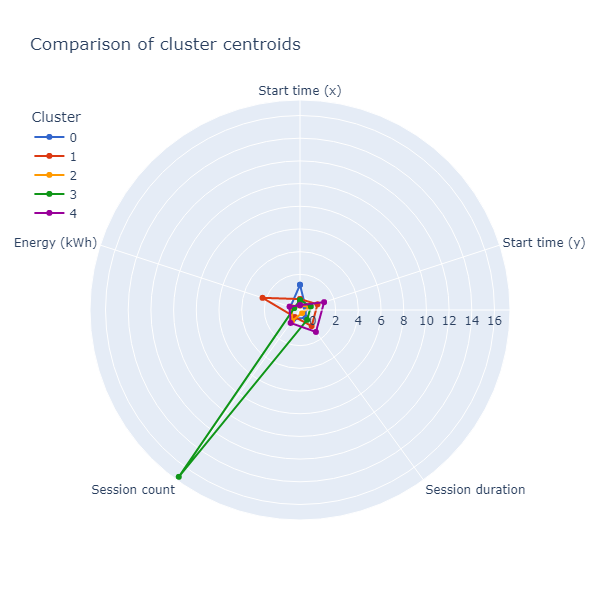

In [55]:
fig = px.line_polar(
    df,
    theta="theta",
    r="r",
    line_close=True,
    color="kmeans_cluster",
    # for some reason, I had to replicate the color sequence here as "px.line_polar" is not using "px.colors.qualitative.G10" properly
    color_discrete_sequence=[
        "#3366CC", "#DC3912", "#FF9900", "#109618", "#990099", "#3366CC", "#DC3912", "#FF9900", "#109618", "#990099", "#3366CC", "#DC3912", "#FF9900", "#109618", "#990099"
        ],
    category_orders={"kmeans_cluster": ["0", "1", "2", "3", "4"]},
    title="Comparison of cluster centroids",
    width=600,
    height=600,
    markers=True,
    labels={
        "kmeans_cluster": "Cluster",},
    #range_r=[0,20]
)
fig.update_layout(
    legend=dict(yanchor="top", y=0.99, xanchor="right", x=0.01),
)

#fig.show()
# Instead of Plotly show() we can also take the bytes of the image and display it in the notebook directly using Image
img_bytes = fig.to_image(format="png")
Image(img_bytes)

In [56]:
df

,theta,r,kmeans_cluster
0,Start time (x),1.083230,0
1,Start time (y),-0.604020,0
2,Session duration,-0.293928,0
3,Session count,-0.166278,0
4,Energy (kWh),-0.251068,0
0,Start time (x),-0.178127,1
1,Start time (y),0.482410,1
2,Session duration,0.610033,1
3,Session count,-0.371750,1
4,Energy (kWh),2.330441,1


## Persisting the results of the clustering

We also need to persist information about the clusters. We are adding a new column to the dataframe that stores the cluster number and saving it as a feather document.

This is loaded by the next notebook.

In [57]:
X[['evse_id', 'kmeans_cluster']].shape

(130839, 2)

1. Using a temporary dataframe to store cluster information grouped properly together.
2. Afterwards, we are joining the cluster information to the original dataframe, we are loading from a feather file.
3. The joined set is persisted also to a feather file.

In [58]:
temp = X[['evse_id', 'kmeans_cluster']].copy()

temp['cluster_frequency'] = temp[['evse_id', 'kmeans_cluster']].groupby(['evse_id','kmeans_cluster'])['evse_id'].transform('count')
temp.drop_duplicates(['evse_id', 'kmeans_cluster'], inplace=True)

In [59]:
CLUSTERS = ['0', '1', '2', '3', '4']

temp = X[['evse_id', 'kmeans_cluster']].copy()

temp['cluster_frequency'] = temp[['evse_id', 'kmeans_cluster']].groupby(['evse_id','kmeans_cluster'])['evse_id'].transform('count')
temp.drop_duplicates(['evse_id', 'kmeans_cluster'], inplace=True)

temp = temp.pivot(index='evse_id', columns='kmeans_cluster', values='cluster_frequency').fillna(0).astype(int).reset_index()
temp['cluster'] = temp[CLUSTERS].idxmax(axis=1).astype(int)
temp['cluster_weight'] = temp.apply(lambda x: x[CLUSTERS].max() / x[CLUSTERS].sum(), axis=1)

# We now have a data frame for each evse with the cluster it belongs to and the weight of that cluster
# evse_id is there, but we need to hide it in the public notebook
temp.drop(columns=['evse_id']).sample(10, random_state=42)

kmeans_cluster,0,1,2,3,4,cluster,cluster_weight
5369,0,1,0,0,0,1,1.000000
2463,1,0,0,0,0,0,1.000000
2505,0,0,2,0,0,2,1.000000
5419,0,1,4,0,0,2,0.800000
1315,2,0,18,0,57,4,0.740260
296,6,0,1,0,0,0,0.857143
969,55,9,9,0,1,0,0.743243
4883,0,0,1,0,0,2,1.000000
683,13,0,29,0,84,4,0.666667
3133,1,3,3,0,0,1,0.428571


In [60]:
# Loading the original charging stations dataset
charging_stations = gpd.read_feather(Path.joinpath(Path.cwd(), 'data', 'private', 'Charging stations.feather'))
charging_stations.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 7229 entries, 4631 to 22828
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   evse_id                 7229 non-null   object  
 1   latitude                7229 non-null   float64 
 2   longitude               7229 non-null   float64 
 3   zip code                7225 non-null   object  
 4   town                    7225 non-null   object  
 5   geometry                7229 non-null   geometry
 6   amenity_osm_id          1386 non-null   float64 
 7   amenity_latitude        1386 non-null   float64 
 8   amenity_longitude       1386 non-null   float64 
 9   amenity                 1386 non-null   object  
 10  amenity_distance        1386 non-null   float64 
 11  landuse_osm_id          5421 non-null   object  
 12  landuse_fclass          5421 non-null   object  
 13  reverse_osm_id          7229 non-null   int64   
 14  reverse_osm_type 

In [61]:
# Adding the cluster information to the charging stations dataset
charging_stations_with_clusters = charging_stations.set_index('evse_id').join(temp.set_index('evse_id'), on='evse_id', how='inner').reset_index()

In [62]:
# Saving the set
charging_stations_with_clusters.astype({'evse_id': 'str'}).to_feather(Path.joinpath(Path.cwd(), 'data', 'private', 'Charging stations with clusters.feather'))
charging_stations_with_clusters.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5194 entries, 0 to 5193
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   evse_id                 5194 non-null   object  
 1   latitude                5194 non-null   float64 
 2   longitude               5194 non-null   float64 
 3   zip code                5192 non-null   object  
 4   town                    5192 non-null   object  
 5   geometry                5194 non-null   geometry
 6   amenity_osm_id          1211 non-null   float64 
 7   amenity_latitude        1211 non-null   float64 
 8   amenity_longitude       1211 non-null   float64 
 9   amenity                 1211 non-null   object  
 10  amenity_distance        1211 non-null   float64 
 11  landuse_osm_id          3706 non-null   object  
 12  landuse_fclass          3706 non-null   object  
 13  reverse_osm_id          5194 non-null   int64   
 14  reverse_osm_type